<center><h1>Introduction to Probabilistic Graphical Models</h1>
<h2>Mini Project</h2>
    <h3>Aymen DABGHI</h3>
</center>

## MAP estimation on NMF

- We consider the following probabilistic non-negative matrix factorization (NMF) model :

$$ w_{fk} \sim \mathcal{G}(w_{fk};\alpha_w,\beta_w) $$
$$ h_{kn} \sim \mathcal{G}(h_{kn};\alpha_h,\beta_h) $$
$$ v_{fn}|w_{f,:},h_{:,n} \sim \mathcal{PO}(v_{fn};\sum_{k=1}^K w_{fk}h_{kn}) $$

where $\mathcal{G}$ and $\mathcal{PO}$ denote the Gamma and the Poisson distributions, respectively, and $f=1 \ldots F , n=1 \ldots N , k=1 \ldots K$ for all the problem 

- We'll then have : 

$$ p(w_{fk}) = \frac{w_{fk}^{\alpha_w - 1} \beta_w^{\alpha_w} \exp(-\beta_w w_{fk})}{\Gamma(\alpha_w)} $$
$$ p(h_{kn}) = \frac{h_{kn}^{\alpha_h - 1} \beta_h^{\alpha_h} \exp(-\beta_h h_{kn})}{\Gamma(\alpha_h)} $$
$$ p(v_{fn}) = \exp(v_{fn} \log(\lambda) - \lambda - \log(\Gamma(v_{fn} + 1) )  \quad where \quad \lambda = \sum_{k=1}^K w_{fk}h_{kn}$$

## Question 1
### 1)
The directed graphical model for the problem is the following :

In [38]:
# The directed graphical model : W + H -> V

import networkx as nx
import matplotlib.pyplot as plt

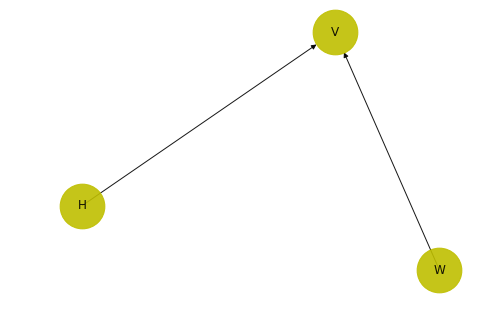

In [41]:
G = nx.DiGraph()
G.add_nodes_from(range(3))
G.add_edge(0, 2)
G.add_edge(1, 2)
mapping = {0: 'W', 1: 'H', 2: 'V'}
H = nx.relabel_nodes(G, mapping)
nx.draw(H , with_labels = True , node_color = 'y' , node_size = 2000 , alpha = 0.9)
plt.show()

### 2)

- Our goal is to find $W$ and $H$ such that :

\begin{align*}
(W^\ast, H^\ast) &= \arg \max_{(W,H)} \log p(W,H\mid V) \\
        &= \arg \max_{(W,H)} \log (\frac{p(V\mid W, H)p(W,H)}{p(V)})  \\
        &= \arg \max_{(W,H)} \log p(V\mid W, H) + \log p(W,H) \\
        &= \arg \max_{(W,H)} \log p(V, W, H)
\end{align*}

- So, in order to achieve our goal, we will have to introduce an auxiliary latent random variable, that we are going to call $S$, where :

<br>
$$
\left\{
    \begin{array}{ll}
        s_{fnk} \mid w_{fk},h_{kn} \sim \mathcal{PO} (s_{fnk};w_{fk}h_{kn}) \\
        \sum_{k=1}^K s_{fnk}= v_{fn}
    \end{array}
\right.
$$

- And therefore, our problem will look like this : 

###### 1) E-Step : 

$ \boxed {\mathcal{L}_{t}(W,H) = \mathbb{E} [\log p(V,S,W,H)]_{p(S\mid V,W_{t},H_{t})} }$

###### 2) M-Step : 

$ \boxed {(W_{t+1},H_{t+1}) = \arg \max_{(W_t,H_t)}  \mathcal{L}_{t} } $


<br>


Before starting, we have to mention that the introduction of $S$ have changed our graphical model to the one below :

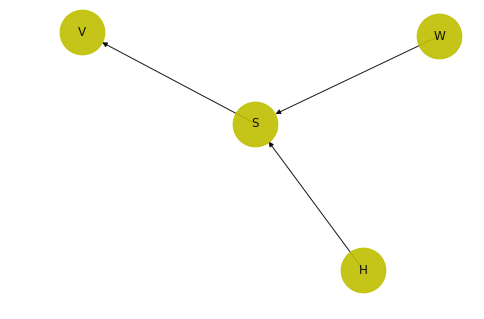

In [46]:
G = nx.DiGraph()
G.add_nodes_from(range(4))
G.add_edge(0, 2)
G.add_edge(1, 2)
G.add_edge(2, 3)
mapping = {0: 'W', 1: 'H', 2: 'S', 3: 'V'}
H = nx.relabel_nodes(G, mapping)
nx.draw(H , with_labels = True , node_color = 'y' , node_size = 2000 , alpha = 0.9)
plt.show()

#### Please note that a coming result is due to the change of the graph, this result is marked by (*)

1- We will start, of course, by the E-step

- ###### Computing $\log p(V,S,W,H)$ :

\begin{align*}
\log p(V,S,W,H) &= \log (p(V,S|W,H) p(W,H)) \\
                &= \log (p(V|S) p(S|W,H) p(W,H)) \quad \quad \quad \quad \quad (*) \quad \text{because $S$ d-seperates $V$ from $W$ and $H$}\\ 
                &= \log p(V|S) + \log p(S|W,H) + log p(W,H) \\
\end{align*}

However, we know that : $ \quad  p(V|S) = \delta(v_{fn}-\sum_{k=1}^K s_{fnk})$

We assume from now on that : $ \quad v_{fn} = \sum_{k=1}^K s_{fnk} \quad \rightarrow \quad \log p(V|S) = 0$

Then : 

\begin{align*}
\log p(V,S,W,H) &= \log p(S|W,H) + \log p(W) + \log p(H) \\
                &= \sum_{fnk} \log\mathcal{PO} (s_{fnk};w_{fk}h_{kn})  + \sum_{fk} \log \mathcal{G} (w_{fk},\alpha_{w},\beta_{w}) + \sum_{nk} \log \mathcal{G} (h_{kn},\alpha_{h},\beta_{h}) \\
                &= \sum_{fnk} [ s_{fnk} \log(w_{fk}h_{kn}) - w_{fk}h_{kn} - \log(\Gamma(s_{fnk}) + 1) ]
                    + \sum_{fk} [(\alpha_w - 1) \log w_{fk} + \alpha_w \log \beta_w - \beta_w w_{fk} - \log(\Gamma(\alpha_w))] + \sum_{kn} [(\alpha_h - 1) \log h_{kn} + \alpha_h \log \beta_h - \beta_h h_{kn} - \log(\Gamma(\alpha_h))]
\end{align*}

Now since we are going to derive according to $W$ and $H$ in the M-Step, and since some entities don't depend on $W$ and $H$, then we can omit these terms and put them into a constant $c$ according to $W$ and $H$. We will then have :

$$ \boxed { \log p(V,S,W,H) = \sum_{fnk} [ s_{fnk} \log(w_{fk}h_{kn}) - w_{fk}h_{kn} ]
                    + \sum_{fk} [(\alpha_w - 1) \log w_{fk} - \beta_w w_{fk}] 
                    + \sum_{kn} [(\alpha_h - 1) \log h_{kn} - \beta_h h_{kn}] + c } $$



- ###### Computing $\log p(S\mid V,W_t,H_t)$ :

According to Bayes rule: 
<br>
$ p(S\mid V,W,H) = \frac{p(S,V\mid W,H)}{p(V\mid W,H)} = \frac{p(V|S)p(S|W,H)}{p(V\mid W,H)} \quad \quad \quad (*)$

So :

\begin{align*}
\log p(S\mid V,W,H) &= \log p(V|S) + \log p(S|W,H) - \log p(V\mid W,H)
\end{align*}

Ans as we mentioned above, we are assuming that : $ \quad v_{fn} = \sum_{k=1}^K s_{fnk} \quad \rightarrow \quad \log p(V|S) = 0$

Therefore : 

\begin{align*}
\log p(S\mid V,W,H) &= \log p(S|W,H) - \log p(V\mid W,H) \\
                        &= \sum_{fnk} [ s_{fnk} \log(w_{fk}h_{kn}) - w_{fk}h_{kn} - \log(\Gamma(s_{fnk}) + 1) ] - \sum_{fn} [v_{fn} \log  (\lambda) - \lambda - log ~ \Gamma (v_{fn}+1)] \\
                        &= \sum_{fn} \log(\Gamma(v_{fn})+1) + \sum_{fnk} [s_{fnk} \log s_{fnk} \frac{w_{fk}h_{kn}}{\lambda} - \log(\Gamma(s_{fnk})+1)] \\
                        &= \sum_{fn} \log(v_{fn}!) + \sum_{fnk} [s_{fnk} \log s_{fnk} \frac{w_{fk}h_{kn}}{\lambda} - \log(s_{fnk}!)] \\
                        &= \sum_{fn} \log(\frac {v_{fn}!}{\prod_k (s_{fnk}!)} \prod_k (\frac{w_{fk}h_{kn}}{\lambda})^{s_{fnk}}) 
\end{align*}

$$ \boxed { \log p(S\mid V,W_t,H_t) = \log \prod_{fn} \mathcal{M}(s_{fn:} | \frac{w_{f1}h_{1n}}{\lambda} \ldots \frac{w_{fK}h_{Kn}}{\lambda} , v_{fn} ) } $$

Where $\mathcal{M}$ is the multinomial distribution and $\lambda = \sum_{k=1}^K w_{fk}h_{kn}$ as defined at first.

Finally, we get the result : 

$$ \boxed {
\mathcal{L}_{t}(W,H) = \sum_{fnk} [ \mathbb{E}[s_{fnk}] \log(w_{fk}h_{kn}) - w_{fk}h_{kn} ]
                    + \sum_{fk} [(\alpha_w - 1) \log w_{fk} - \beta_w w_{fk}] 
                    + \sum_{kn} [(\alpha_h - 1) \log h_{kn} - \beta_h h_{kn}]
}$$

2- Now, the M-Step :

The M-Step consists in finding $W_{t+1}$ and $H_{t+1}$ such that : $\quad {(W_{t+1},H_{t+1}) = \arg \max_{(W_t,H_t)}  \mathcal{L}_{t} } $ 


$\frac{\partial(\mathcal{L}_{t}(W,H))}{\partial w_{fk}} = 0 \quad$ gives us : $$ \boxed {  w_{fk}^{t+1} = \frac{(\alpha_{w}-1) + \sum_{n}\mathbb{E}[s_{fnk}]}{\beta_{w} + \sum_{n}h_{kn}^t} }  $$

And, in the same way, we obtain : $$ \boxed { h_{kn}^{t+1} = \frac{(\alpha_{h}-1) + \sum_{n} \mathbb{E}[s_{fnk}]}{+\beta_{h} + \sum_{n}w_{fk}^{t}} } $$


## Question 2
### 1)

In the implementation part, we will not use the expressions above, but instead we will implement our EM algorithm using the matrix notation, which leads to the expressions below :

$$ \boxed { W^{t+1} = \frac{(\alpha_w - 1)*O_w + W^t \odot ((V \oslash (W^tH^t))(H^t)^T)}{\beta_w O_w + O(H^t)^T} } $$
<br>
$$ \boxed { H^{t+1} = \frac{(\alpha_h - 1)*O_h + H^t \odot ((W^t)^T(V\oslash (W^tH^t)))}{\beta_h O_h + (W^t)^TO} } $$

Where $O$, $O_w$ and $O_h$ are matrices of the same size as $V$, $W$ and $H$ having ones in all their elements, and $\odot$ and $\oslash$ denote element wise multiplication and division respectively.

In [1]:
# Packages needed

import scipy.io as sio
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

In [2]:
# Loading the data

data = sio.loadmat('attfaces.mat')
V = data['V']

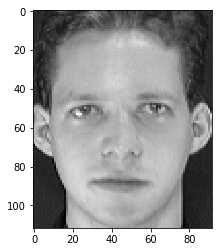

In [3]:
# Visualizing the first image

first_image = V[:,0].reshape((92,112)).T
plt.figure()
plt.imshow(first_image , cmap='gray')

In [18]:
def visualize_images(J , X):
    # Function to make plotting faces easier
    # Store all images in the variable all_images in order to form a matrix of the faces that can be plotted

    all_images = []
    for j in range(J):
        all_images.append(np.concatenate(([X[:,i].reshape((92,112)).T for i in range(j*J,(j+1)*J)]) , axis=1))
    all_images = np.concatenate(([all_images[i] for i in range(J)]) , axis=0)
    return all_images

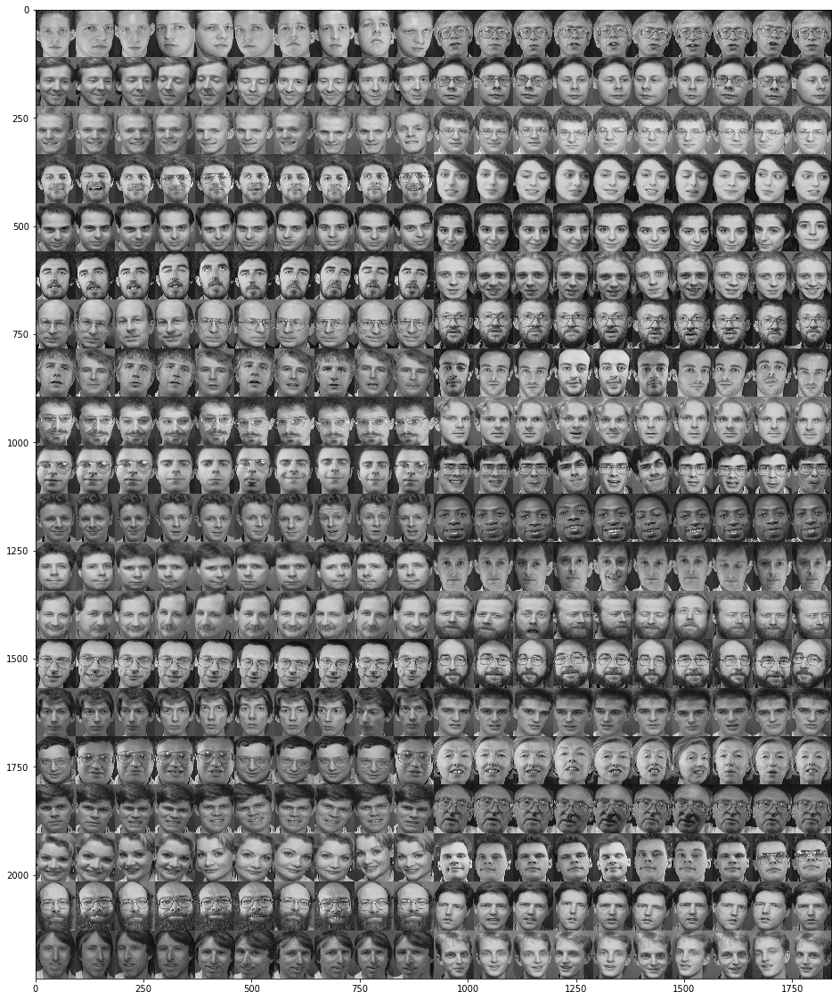

In [17]:
# Display the matrix V

all_images = visualize_images(20,V)
plt.figure(figsize=(20,20))
plt.imshow(all_images,cmap='gray')

In [6]:
def EM(W , H , V , alpha_w , beta_w , alpha_h , beta_h):
    
    # Initializing O, O_w and O_h
    O = np.ones_like(V)
    O_w = np.ones_like(W)
    O_h = np.ones_like(H)
    
    # Updating W and H
    W_new = ((alpha_w - 1) * O_w + W * ((V/W.dot(H)).dot(H.T))) / (beta_w * O_w + O.dot(H.T))
    H_new = ((alpha_h - 1) * O_h + H * (W.T.dot(V/W.dot(H)))) / (beta_h * O_h + W.T.dot(O))
    
    return W_new , H_new

In [7]:
def run_EM(W , H , V , alpha_w , beta_w , alpha_h , beta_h , n_iter):
    for i in range(n_iter):
        W_new , H_new = EM(W , H , V , alpha_w , beta_w , alpha_h , beta_h)
        W = W_new
        H = H_new
    return W , H

In [22]:
# We will start by displaying the result of the EM-algorithm as it is, for alpha_w, alpha_h, beta_w and beta_h 
# all equal to 1

alpha_w = 1
alpha_h = 1
beta_w = 1
beta_h = 1
K = 25
F , N = V.shape
n_iter = 100
W_init = np.random.gamma(alpha_w , 1./beta_w , (F,K))
H_init = np.random.gamma(alpha_h , 1./beta_h , (K,N))

W , H = run_EM(W_init , H_init , V , alpha_w , beta_w , alpha_h , beta_h , n_iter)

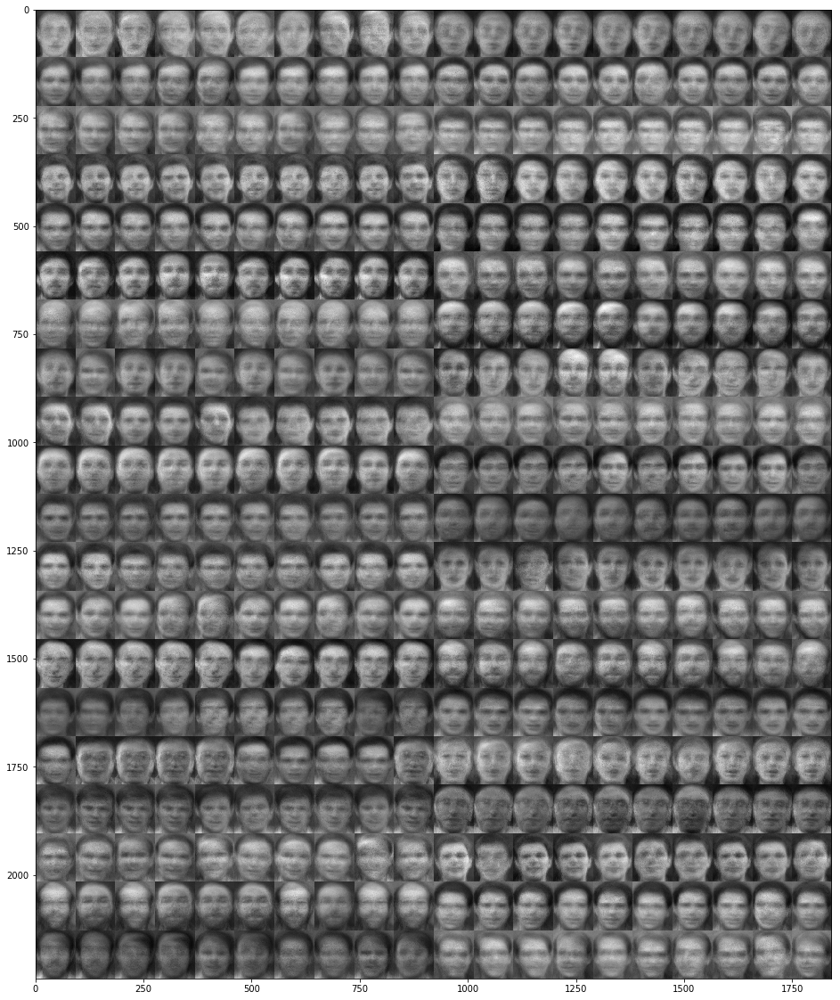

In [23]:
V_new = W.dot(H)
new_images = visualize_images(20,V_new)
plt.figure(figsize=(20,20))
plt.imshow(new_images , cmap='gray')

### 2)
<br>
In this question, we will set :

- $K=25$
- $\alpha_w = \alpha_h = 1$

And we will vary the values of $\beta_w$ and $\beta_h$ between small and big values in order to understand the influence of $\beta$

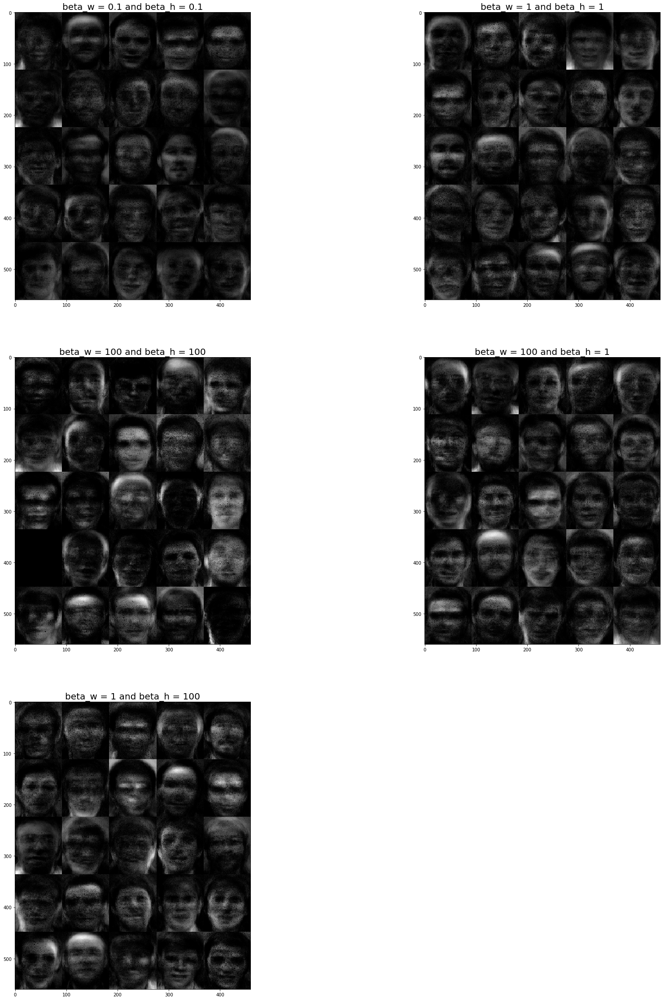

In [32]:
beta_values = [(0.1,0.1) , (1,1) , (100,100) , (100,1) , (1,100)]
fig = plt.figure(figsize=(30,40))
i=1
for betas in beta_values:
    W_init = np.random.gamma(alpha_w , 1./betas[0] , (F,K))
    H_init = np.random.gamma(alpha_h , 1./betas[1] , (K,N))
    W , H = run_EM(W_init , H_init , V , alpha_w , betas[0] , alpha_h , betas[1] , n_iter)
    W_columns = visualize_images(5,W)
    ax = plt.subplot(3,2,i)
    ax.set_title("beta_w = " + str(betas[0]) + " and beta_h = " + str(betas[1]) , fontsize=20)
    plt.imshow(W_columns , cmap='gray')
    i+=1

Before giving any comments about varying $\beta$ and its consequences, we have to say that $\beta$ is not the scale itself of the Gamma distribution, but its inverse : $\beta = \frac1{scale}$
<br>
- For small values of $\beta_w$ and $\beta_h$ ($0.1$ for both for example), which corresponds to big values of the scales, we can see noisy images. Although we can confirm that the images are faces, we are unfortunately unable to differentiate the facial parts from one another. This is due to the fact that both matrices $W$ and $H$ are dense in this case
- Now if we increase the value of $\beta_w$ and $\beta_h$ ($100$ for both for example), meaning we made the scale smaller, then we can notice that the images get darker and some facial expressions are becoming clearer to distinguish (hair, cheeks, foreheads ...). It is due to the fact that $W$ and $H$ are sparser than before.
- Rather than sparsity, there is another parameter that is affected by $\beta$ which is the magnitude of the components; in fact, if we decresea $\beta$, the magnitude decreases and vice-versa.

### 3)
<br>
In this question, $K$ is still equal to $25$, we will fix $\beta_w = \beta_h = 1$ and we will vary the values of $\alpha_w$ and $\alpha_h$ between small and big values in order to understand its influence.

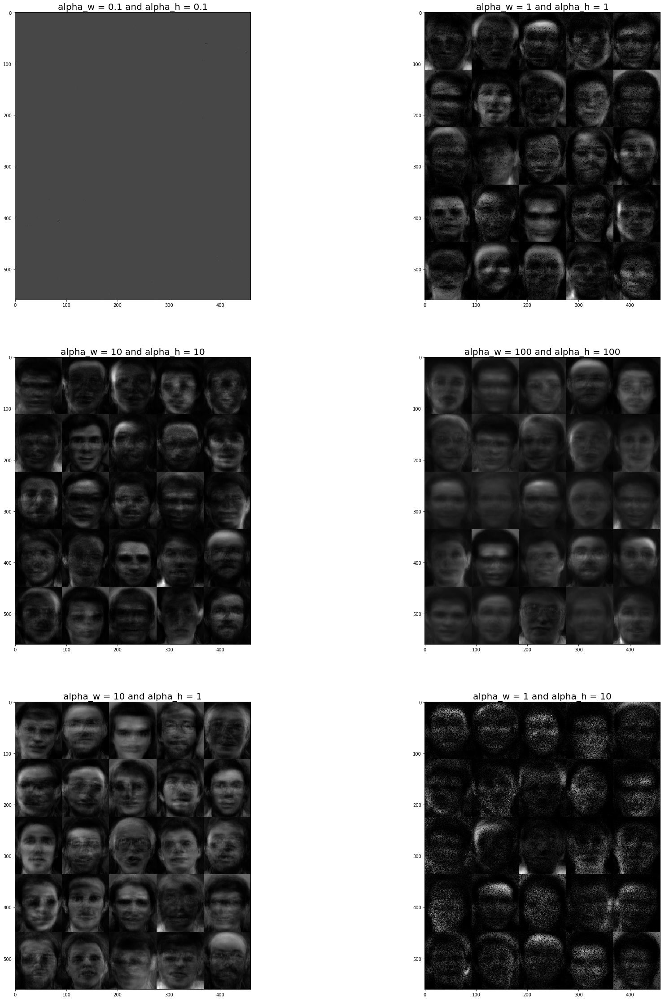

In [33]:
alpha_values = [(0.1,0.1) , (1,1) , (10,10) , (100,100) , (10,1) , (1,10)]
fig = plt.figure(figsize=(30,40))
i=1
for alphas in alpha_values:
    W_init = np.random.gamma(alphas[0] , 1./beta_w , (F,K))
    H_init = np.random.gamma(alphas[1] , 1./beta_h , (K,N))
    W , H = run_EM(W_init , H_init , V , alphas[0] , beta_w , alphas[1] , beta_w , n_iter)
    W_columns = visualize_images(5,W)
    ax = plt.subplot(3,2,i)
    ax.set_title("alpha_w = " + str(alphas[0]) + " and alpha_h = " + str(alphas[1]) , fontsize=20)
    plt.imshow(W_columns , cmap='gray')
    i+=1

As one can notice, the shape parameter $\alpha$ determines if our matrices $W$ and $H$ are sparse or dense. In fact, small values of $\alpha$ enforce sparser representations as most of coefficients will be very close to zero, while large values of $\alpha$ make the values close to a nonzero mean and therefore enforces a non-sparse representation. We will try now to comment each representation of the $W$ columns for different values of $\alpha$ :

- $(\alpha_w , \alpha_h) = (0.1,0.1)$ : Here, we forced both matrices to be sparse and the result, which represents noisy and non-clear images, shows that many components are zeroed.
- If we increase the value of $(\alpha_w , \alpha_h)$, we make $W$ and $H$ denser, which explains the dark images that we get. For example, for $(\alpha_w , \alpha_h) = (10,10)$, we start to observe some average face images.
- But the best among the images above is the last, in which we enforced $W$ to be sparse but not $H$. Here, we can distinguish parts of individual face images (chins, foreheads, ears ...), which we called "trends" in the course.


$\Rightarrow$ Best results are obtained when initialising the shape hyperparameters asymmetrically, for example $\alpha_w = 1$ and $\alpha_h = 10$. When the shape hyperparameters are set to small values $\ll 1$, the EM seems to get stuck in a local minima and therefore the prediction results are poorer.

### 4)
<br>
In the final question, we will fix $\alpha_w = \alpha_h = \beta_w = \beta_h = 1$ and we will vary the number of components K.

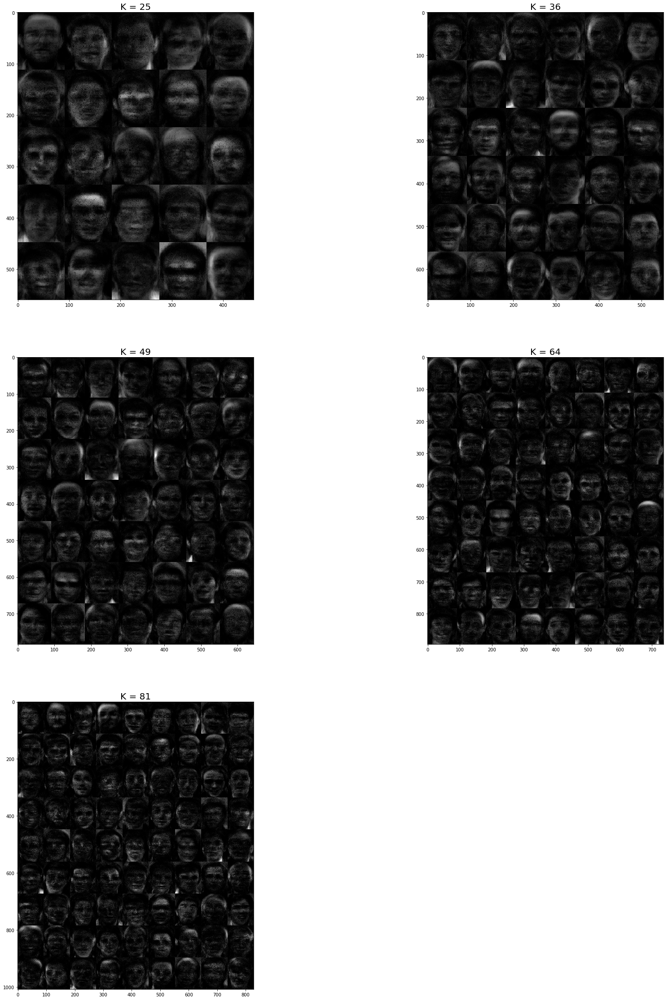

In [36]:
K = [25 , 36 , 49 , 64 , 81]
fig = plt.figure(figsize=(30,40))
i=1
for k in K:
    W_init = np.random.gamma(alpha_w , 1./beta_w , (F,k))
    H_init = np.random.gamma(alpha_h , 1./beta_h , (k,N))
    W , H = run_EM(W_init , H_init , V , alpha_w , beta_w , alpha_h , beta_w , n_iter)
    W_columns = visualize_images(int(np.sqrt(k)),W)
    ax = plt.subplot(3,2,i)
    ax.set_title("K = " + str(k) , fontsize=20)
    plt.imshow(W_columns , cmap='gray')
    i+=1

We will discuss the parameter K according to whether its value is high or low :

- If K is big, then each column of the matrix $W$, as we already know, will display a facial feature, the number of these features gets big and therefore the approximation will be better. However, a big value of K may induce two problems : the first is related to the facial features; we will not be able to distinguish which part of the face we're talking about, and the second is that our model will be more complex, as $W$ and $H$ depend on K and computing them will be more time and ressources consuming.

- If K is small, the approximation may not give a good result, as we can find a single image of the $W$ columns that represent two or more facial features. But still, we will have a simple model.

$\Rightarrow$ The choice of K should then be a compromise between the quality of the approximation and the complexity of the model.